In [1]:
from stable_baselines3.common.atari_wrappers import AtariWrapper
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack, VecTransposeImage
import pandas as pd
import gymnasium as gym
import ale_py
import matplotlib.pyplot as plt
import numpy as np
import base64
import cv2
import torch
import os
import torch.nn.functional as F
import math
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import shap
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import cdist
import pickle
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
from stable_baselines3.common.callbacks import EvalCallback

from sympy import latex
from IPython.display import display, Math

import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split

from sklearn.preprocessing import StandardScaler

np.math = math
gym.register_envs(ale_py)

c:\Users\Administrator\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Cuda

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Establish Atari Environment

In [3]:
def make_MsPacman_env():
  env = gym.make("MsPacmanNoFrameskip-v4")
  env = AtariWrapper(env)
  return env

# Construct CNN-based Feature Extractors

In [4]:
class NatureCNN(BaseFeaturesExtractor):
    """
    Nature CNN feature extractor as in Mnih et al. (2015), used in SB3’s CnnPolicy/QNetwork.
    Dimension of feature vector is 16

    :param observation_space: (gym.Space) Image Observation Space，Shape (C, H, W)
    :param features_dim: (int) Final output feature dimension，default 16
    """
    def __init__(self, observation_space, features_dim: int = 16):
        super().__init__(observation_space, features_dim)

        # print(observation_space.shape)

        n_input_channels = observation_space.shape[0]

        # print(n_input_channels)

        self.cnn = nn.Sequential(
            nn.Conv2d(n_input_channels, 32, kernel_size=8, stride=4, padding=0),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(start_dim=1)
        )

        # figure out size of the flattened CNN output
        with torch.no_grad():
            obs = observation_space.sample()
            obs_tensor = torch.as_tensor(obs)[None].float()
            n_flatten = self.cnn(obs_tensor).shape[1]

            # print(n_flatten)

        self.linear = nn.Sequential(
            nn.Linear(n_flatten, 512),
            nn.ReLU(),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Linear(128, features_dim),
            nn.ReLU(),
        )

    def forward(self, observations: torch.Tensor) -> torch.Tensor:
        # observations: [batch, C, H, W]
        x = self.cnn(observations)
        return self.linear(x)

# PPO


In [5]:
from stable_baselines3 import PPO

In [6]:
n_envs = 8
MsPacman_env = DummyVecEnv([make_MsPacman_env for _ in range(n_envs)]) 
MsPacman_env = VecTransposeImage(MsPacman_env) 
MsPacman_env = VecFrameStack(MsPacman_env, n_stack=4)  

In [7]:
MsPacman_env.observation_space

Box(0, 255, (4, 84, 84), uint8)

In [8]:
MsPacman_env.observation_space.shape

(4, 84, 84)

# Establish PPO

In [9]:
policy_kwargs = dict(
    features_extractor_class=NatureCNN,
    features_extractor_kwargs=dict(features_dim=16)
)

n_timesteps = 1e7
ent_coef = 0.01
vf_coef = 0.25
batch_size = 256
learning_rate = 2.5e-4
clip_range = 0.1
vf_coef = 0.5
ent_coef = 0.01
n_steps = 128
n_epochs = 4

PPO_model = PPO(
    policy="CnnPolicy",
    env=MsPacman_env,
    policy_kwargs=policy_kwargs,
    verbose=1,
    n_steps=n_steps,
    batch_size=batch_size,
    learning_rate=learning_rate,
    ent_coef=ent_coef,
    vf_coef=vf_coef,
    n_epochs=n_epochs,
    clip_range=clip_range,
    tensorboard_log="./MsPacman/ppo"
)

Using cpu device


In [10]:
PPO_model.policy # 查看 PPO 算法模型架构

ActorCriticCnnPolicy(
  (features_extractor): NatureCNN(
    (cnn): Sequential(
      (0): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
      (1): ReLU()
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
      (3): ReLU()
      (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
      (5): ReLU()
      (6): Flatten(start_dim=1, end_dim=-1)
    )
    (linear): Sequential(
      (0): Linear(in_features=3136, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=128, bias=True)
      (3): ReLU()
      (4): Linear(in_features=128, out_features=16, bias=True)
      (5): ReLU()
    )
  )
  (pi_features_extractor): NatureCNN(
    (cnn): Sequential(
      (0): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
      (1): ReLU()
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
      (3): ReLU()
      (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
      (5): ReLU()
      (6): Flatten(start_dim=1, end_dim=-1)
    )
    (

# Train PPO

In [11]:
eval_callback = EvalCallback(
    MsPacman_env,
    best_model_save_path="./MsPacman/ppo",
    log_path="./MsPacman/ppo",   
    eval_freq=100000,      
    n_eval_episodes=10,     
    deterministic=True,    
    render=False,
)

PPO_model.learn(total_timesteps=int(n_timesteps), callback=eval_callback)

PPO_model.save("./MsPacman/ppo")

Logging to ./MsPacman/ppo\PPO_1
-----------------------------
| time/              |      |
|    fps             | 185  |
|    iterations      | 1    |
|    time_elapsed    | 5    |
|    total_timesteps | 1024 |
-----------------------------
------------------------------------------
| time/                   |              |
|    fps                  | 138          |
|    iterations           | 2            |
|    time_elapsed         | 14           |
|    total_timesteps      | 2048         |
| train/                  |              |
|    approx_kl            | 0.0015383572 |
|    clip_fraction        | 0            |
|    clip_range           | 0.1          |
|    entropy_loss         | -2.2         |
|    explained_variance   | 8.36e-05     |
|    learning_rate        | 0.00025      |
|    loss                 | 0.434        |
|    n_updates            | 4            |
|    policy_gradient_loss | -0.0041      |
|    value_loss           | 1.06         |
---------------------------

c:\Users\Administrator\AppData\Local\Programs\Python\Python310\lib\site-packages\stable_baselines3\common\evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Eval num_timesteps=800000, episode_reward=4.80 +/- 4.87
Episode length: 105.50 +/- 37.24
-----------------------------------------
| eval/                   |             |
|    mean_ep_length       | 106         |
|    mean_reward          | 4.8         |
| time/                   |             |
|    total_timesteps      | 800000      |
| train/                  |             |
|    approx_kl            | 0.008935032 |
|    clip_fraction        | 0.182       |
|    clip_range           | 0.1         |
|    entropy_loss         | -1.72       |
|    explained_variance   | 0.928       |
|    learning_rate        | 0.00025     |
|    loss                 | 0.547       |
|    n_updates            | 3124        |
|    policy_gradient_loss | 0.0038      |
|    value_loss           | 1.17        |
-----------------------------------------
New best mean reward!
-------------------------------
| time/              |        |
|    fps             | 89     |
|    iterations      | 782    |
|    

# Load PPO Model

In [12]:
PPO_model = PPO.load("./MsPacman/ppo/best_model.zip")

PPO_model.ent_coef = 0.0
PPO_model.vf_coef = 0.0

In [13]:
PPO_model.policy 

ActorCriticCnnPolicy(
  (features_extractor): NatureCNN(
    (cnn): Sequential(
      (0): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
      (1): ReLU()
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
      (3): ReLU()
      (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
      (5): ReLU()
      (6): Flatten(start_dim=1, end_dim=-1)
    )
    (linear): Sequential(
      (0): Linear(in_features=3136, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=128, bias=True)
      (3): ReLU()
      (4): Linear(in_features=128, out_features=16, bias=True)
      (5): ReLU()
    )
  )
  (pi_features_extractor): NatureCNN(
    (cnn): Sequential(
      (0): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
      (1): ReLU()
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
      (3): ReLU()
      (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
      (5): ReLU()
      (6): Flatten(start_dim=1, end_dim=-1)
    )
    (

In [14]:
PPO_features_extractor = PPO_model.policy.features_extractor
PPO_features_extractor

NatureCNN(
  (cnn): Sequential(
    (0): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
    (3): ReLU()
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ReLU()
    (6): Flatten(start_dim=1, end_dim=-1)
  )
  (linear): Sequential(
    (0): Linear(in_features=3136, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=16, bias=True)
    (5): ReLU()
  )
)

In [15]:
PPO_MlpExtractor = PPO_model.policy.mlp_extractor
PPO_MlpExtractor

MlpExtractor(
  (policy_net): Sequential(
    (0): Linear(in_features=16, out_features=64, bias=True)
    (1): Tanh()
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): Tanh()
  )
  (value_net): Sequential(
    (0): Linear(in_features=16, out_features=64, bias=True)
    (1): Tanh()
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): Tanh()
  )
)

In [15]:
PPO_ActionNet = PPO_model.policy.action_net
PPO_ValueNet = PPO_model.policy.value_net

In [16]:
PPO_ActionNet

Linear(in_features=64, out_features=9, bias=True)

In [17]:
PPO_ValueNet

Linear(in_features=64, out_features=1, bias=True)

# Output the 16-dimensional features for each state and the logits corresponding to all actions

In [18]:
def output_features_logits(obs):

  obs = torch.tensor(obs, dtype=torch.float32, device=device)

  features = PPO_features_extractor(obs)

  policy_values = PPO_MlpExtractor.policy_net(features)

  action_logits = PPO_ActionNet(policy_values)

  return features, action_logits

In [ ]:
input_tensor = torch.randn(1, 4, 84, 84).to(device)  

features, action_logits = output_features_logits(input_tensor)

print(features)

print(action_logits)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_8920\3003378390.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  obs = torch.tensor(obs, dtype=torch.float32, device=device)


tensor([[  0.0000,  39.3800,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
           0.0000,   0.0000,  18.0162,   0.0000, 159.5062,   0.0000,   0.0000,
          42.1715,   0.0000]], device='cuda:0', grad_fn=<ReluBackward0>)
tensor([[ 2.8233, -0.7112, -1.4823,  1.5729, -2.2811,  0.1409,  3.4085, -0.5608,
          3.3941]], device='cuda:0', grad_fn=<AddmmBackward0>)


# Collect Episode Data

In [ ]:
n_envs = 1
MsPacman_env = DummyVecEnv([make_MsPacman_env for _ in range(n_envs)])  
MsPacman_env = VecTransposeImage(MsPacman_env) 
MsPacman_env = VecFrameStack(MsPacman_env, n_stack=4)  

In [ ]:
output_dir = "./MsPacman/ppo/evaluation"
os.makedirs(output_dir, exist_ok=True)

num_episodes = 1000

episode_records = []
action_logits_records = []

def generate_column_names(dimension):
    names = [f"feature_{i+1}" for i in range(dimension)]
    names.append("action")
    names.append("reward")
    return names

for ep in range(1, num_episodes + 1):
    obs = MsPacman_env.reset()
    done = False

    episode_records.clear()
    action_logits_records.clear()

    while not done:
  
        features, action_logits = output_features_logits(obs)

        features = features.squeeze(0).cpu().detach().numpy()
        action_logits = action_logits.squeeze(0).cpu().detach().numpy()

        action, _states = PPO_model.predict(obs, deterministic=True)  

        next_obs, reward, done, info = MsPacman_env.step(action)

        action_array = np.array([action])  
        reward_array = np.array([reward])  

        action_array = action_array.flatten()
        reward_array = reward_array.flatten()

        record = np.concatenate([features, action_array, reward_array])

        episode_records.append(record)
        action_logits_records.append(action_logits)

        obs = next_obs

    file_path = os.path.join(output_dir, f"episode_{ep}.csv")
    action_logits_file_path = os.path.join(output_dir, f"episode_{ep}_action_logits.txt")

    column_names = generate_column_names(features.shape[0])  

    df = pd.DataFrame(episode_records, columns=column_names)

    df.to_csv(file_path, index=False)

    with open(action_logits_file_path, 'a') as f:
        for action_logits in action_logits_records:
            action_logits_str = ",".join(map(str, action_logits.flatten()))  
            f.write(f"{action_logits_str}\n")

    episode_records.clear()
    action_logits_records.clear()

# Merge Episode

In [ ]:
dim_16 = "./MsPacman/ppo/evaluation"

def extract_episode_data(dim_dir, feature_dim, output_file):

    episodes = []  

    if os.path.exists(output_file):
        print(f"{output_file} already exists. Skipping extraction.")
        return

    for episode_file in os.listdir(dim_dir):
        if episode_file.endswith(".csv"):
            episode_name = episode_file.replace(".csv", "") 
            action_logits_file = episode_name + "_action_logits.txt"  

            episode_path = os.path.join(dim_dir, episode_file)
            action_logits_path = os.path.join(dim_dir, action_logits_file)

            if os.path.exists(action_logits_path):
   
                df = pd.read_csv(episode_path)
                states = df[[f"feature_{i}" for i in range(1, feature_dim+1)]].values  # (T, feature_dim)

                action_logits = np.loadtxt(action_logits_path, delimiter=",")  # (T, n_actions)

                max_action_logits = np.max(action_logits, axis=1)  

                actions = np.argmax(action_logits, axis=1)  

                episode_data = np.column_stack((states, max_action_logits, actions))
                episodes.append(episode_data)
            else:
                print(f"Missing action_logits file for {episode_name}, skipping...")

    all_episode_data = np.vstack(episodes)  # (T_total, feature_dim+1)
    columns = [f"feature_{i}" for i in range(1, feature_dim+1)] + ["max_action_logits", "action"]
    episode_df = pd.DataFrame(all_episode_data, columns=columns)
    episode_df.to_csv(output_file, index=False)
    print(f"Data extracted and saved to {output_file}")

extract_episode_data(dim_16, 16, "./MsPacman/ppo/eval_data.csv")

Data extracted and saved to ./MsPacman/ppo/eval_data.csv


# Compute SHAP

In [10]:
# Step 1: Load and prepare the data
data = pd.read_csv('./MsPacman/ppo/eval_data.csv')

X = data.drop(columns=['max_action_logits', 'action']).values
Y = data['max_action_logits'].values
Z = data['action'].values

X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
X_tensor[0]

tensor([    0.0000,  2389.4268,     0.0000,   204.8413,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000,  1081.1989,     0.0000, 14702.5049,
            0.0000,     0.0000,  6061.8257,     0.0000], device='cuda:0')

In [11]:
len(X_tensor)

196876

In [12]:
class ActionLogitFromFeatures(nn.Module):
    def __init__(self, mlp_extractor, action_net):
        super().__init__()
        self.policy_net = mlp_extractor.policy_net
        self.action_net = action_net

    def forward(self, state_features):
        x = self.policy_net(state_features)
        logits = self.action_net(x)               
        return logits                         

In [ ]:
PPO_PolicyActor = ActionLogitFromFeatures(PPO_MlpExtractor, PPO_ActionNet)
PPO_PolicyActor(X_tensor[0])

In [24]:
background_size = int(len(X_tensor) * 0.01)  # Choose 1% of the data
background_data = X_tensor[:background_size]


# print(background_size)
# print(background_data.shape)

explainer = shap.DeepExplainer(PPO_PolicyActor, background_data)
shap_values = explainer.shap_values(X_tensor, check_additivity=False)

In [ ]:
n_samples, n_features, n_actions = shap_values.shape
feature_names = data.drop(['max_action_logits','action'], axis=1).columns.tolist()

actions = Z.astype(int)           # shape = (n_samples,)
sample_idx = np.arange(n_samples) # [0,1,2,…,n_samples-1]

shap_max = shap_values[sample_idx, :, actions]

shap_df = pd.DataFrame(shap_max, columns=feature_names)
shap_df['max_action_logits'] = Y
shap_df['action']            = Z

out_path = './MsPacman/ppo/shap_data.csv'
shap_df.to_csv(out_path, index=False)
print(f"[+] Saved：{out_path}")

[+] 已保存：./MsPacman/ppo/shap_data.csv


In [14]:
shap_data = pd.read_csv('./MsPacman/ppo/shap_data.csv').drop(columns=['max_action_logits', 'action']).values
feature_names = pd.read_csv('./MsPacman/ppo/shap_data.csv').drop(['max_action_logits','action'], axis=1).columns.tolist()

In [15]:
shap_data[0]

array([ 0.00000000e+00,  8.18008959e-01,  0.00000000e+00, -9.84903648e-02,
       -4.22318517e-05,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  6.85013771e-01,  1.12356562e-02,  4.84978557e-01,
        0.00000000e+00,  0.00000000e+00,  1.52555620e-02,  0.00000000e+00])

In [16]:
X[0]

array([    0.        ,  2389.42675781,     0.        ,   204.84127808,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,  1081.19885254,     0.        , 14702.50488281,
           0.        ,     0.        ,  6061.82568359,     0.        ])

In [17]:
feature_names

['feature_1',
 'feature_2',
 'feature_3',
 'feature_4',
 'feature_5',
 'feature_6',
 'feature_7',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_11',
 'feature_12',
 'feature_13',
 'feature_14',
 'feature_15',
 'feature_16']

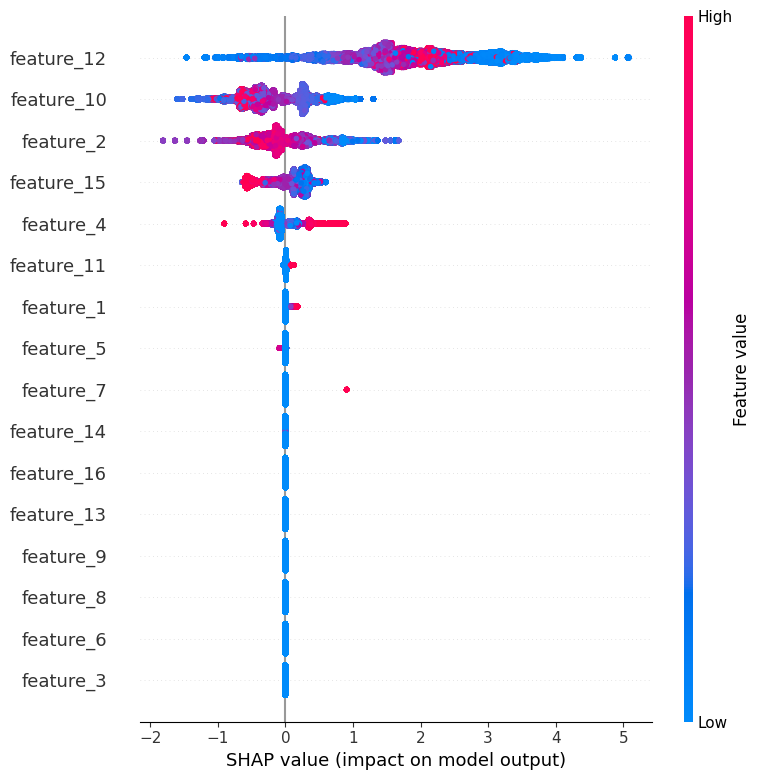

<Figure size 640x480 with 0 Axes>

In [19]:
plt.figure(figsize=(10,10))
shap.summary_plot(shap_data, X, feature_names=feature_names)
plt.savefig('./MsPacman/ppo/MsPacman_PPO_SHAP_value_chart.pdf', format='pdf', bbox_inches='tight')

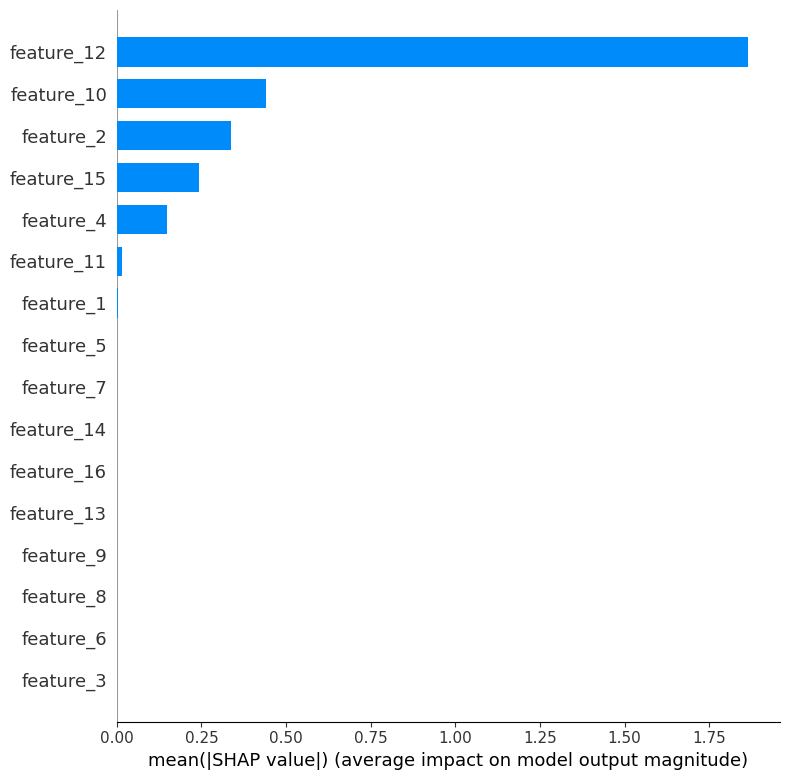

In [ ]:
plt.figure(figsize=(10,10))
shap.summary_plot(shap_data, X, feature_names=feature_names, plot_type="bar")


In [ ]:
shapley_to_state_mapping = {}

for i in range(len(X_tensor)):
    state = X[i]  
    shapley_vector = shap_data[i]  
    
    shapley_to_state_mapping[tuple(shapley_vector)] = state

with open('./MsPacman/ppo/shapley_to_state_mapping.pkl', 'wb') as f:
    pickle.dump(shapley_to_state_mapping, f)

print("The mapping from Shapley vectors to the original states has been saved.")

Shapley向量到原始状态的映射已保存。


In [32]:
shap_data[0]

array([ 0.00000000e+00,  8.18008959e-01,  0.00000000e+00, -9.84903648e-02,
       -4.22318517e-05,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  6.85013771e-01,  1.12356562e-02,  4.84978557e-01,
        0.00000000e+00,  0.00000000e+00,  1.52555620e-02,  0.00000000e+00])

In [33]:
print(shapley_to_state_mapping.get(tuple(shap_data[0])))

[    0.          2389.42675781     0.           204.84127808
     0.             0.             0.             0.
     0.          1081.19885254     0.         14702.50488281
     0.             0.          6061.82568359     0.        ]


# Action K-Means Clustering

In [ ]:
n_actions = MsPacman_env.action_space.n

kmeans = KMeans(n_clusters=n_actions)  
kmeans.fit(shap_data)

,n_clusters,np.int64(9)
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,None
,copy_x,True
,algorithm,'lloyd'


In [ ]:
labels = kmeans.labels_

centroids = kmeans.cluster_centers_

print(f"Cluster Labels: {labels}")
print(f"Cluster Centroids: {centroids}")

Cluster Labels: [2 2 4 ... 3 3 3]
Cluster Centroids: [[ 2.29850861e-17  1.87924221e-01  0.00000000e+00 -7.79332996e-02
  -6.58639324e-05  0.00000000e+00 -1.04625510e-17  0.00000000e+00
   0.00000000e+00 -9.97987562e-02  9.25425866e-03  1.37875470e+00
   0.00000000e+00 -2.70627027e-19  2.11370414e-01  0.00000000e+00]
 [ 3.85975973e-17 -3.78822333e-01  0.00000000e+00 -1.60142657e-01
  -1.75995825e-03  0.00000000e+00  5.42101086e-19  0.00000000e+00
   0.00000000e+00 -9.86745551e-01  3.81221001e-02  3.63575981e+00
   0.00000000e+00  1.10114283e-20  1.85757307e-01  0.00000000e+00]
 [ 3.77757494e-02  6.21763051e-01  0.00000000e+00  2.75392662e-01
  -4.32158093e-04  0.00000000e+00  4.87890978e-19  0.00000000e+00
   0.00000000e+00  5.84338341e-01  8.70053367e-03  7.43773994e-01
   0.00000000e+00  2.36429642e-05 -1.35477853e-01  0.00000000e+00]
 [ 4.00604187e-04  7.54635641e-01  0.00000000e+00 -8.17890937e-02
  -1.21464444e-04  0.00000000e+00  4.87890978e-19  0.00000000e+00
   0.00000000e+00  3

# Boundary Points Identification

In [ ]:
def find_boundary_points(shap_values, n_clusters):

    boundary_points = []

    for i in range(n_clusters):
        for j in range(i + 1, n_clusters):
 
            dist_to_centroids = cdist(shap_values, [centroids[i], centroids[j]], 'euclidean')
                
            dist_diff = np.abs(dist_to_centroids[:, 0] - dist_to_centroids[:, 1])
            boundary_index = np.argmin(dist_diff)
                
            boundary_point = shap_values[boundary_index]
            boundary_points.append((boundary_point, (i, j)))  

    return boundary_points

# DNN approximates RL's behavior to query Boundary's Actions

In [ ]:
df = pd.read_csv("./MsPacman/ppo/eval_data.csv")
scaler = StandardScaler()

X = df[[f"feature_{i}" for i in range(1, 17)]].values.astype(np.float32)
X = scaler.fit_transform(X)   

y = df["action"].values.astype(np.int64)

In [56]:
X[0]

array([-0.16294025, -1.5269183 ,  0.        , -0.33469978, -0.05633624,
        0.        , -0.02126654,  0.        ,  0.        , -1.0502263 ,
       -0.31796393, -0.34688598,  0.        , -0.07640954, -0.05192702,
        0.        ], dtype=float32)

In [57]:
y[0]

np.int64(6)

In [58]:
class FeatureDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

dataset = FeatureDataset(X, y)

train_loader = DataLoader(dataset, batch_size=512, shuffle=True)

In [ ]:
class DNN(nn.Module):
    def __init__(self, input_dim=16, output_dim=9):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, output_dim)
        )

    def forward(self, x):
        return self.net(x)

DNN_model = DNN().to(device)

In [60]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(DNN_model.parameters(), lr=1e-3)

In [61]:
num_epochs = 100
train_losses = []

for epoch in range(num_epochs):
    DNN_model.train()
    total_loss = 0.0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        preds = DNN_model(X_batch)
        loss = criterion(preds, y_batch)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    train_losses.append(total_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}]  Training Loss: {total_loss:.4f}")

Epoch [1/100]  Training Loss: 130.7038
Epoch [2/100]  Training Loss: 25.0703
Epoch [3/100]  Training Loss: 19.3430
Epoch [4/100]  Training Loss: 14.6777
Epoch [5/100]  Training Loss: 11.9921
Epoch [6/100]  Training Loss: 9.7622
Epoch [7/100]  Training Loss: 9.1849
Epoch [8/100]  Training Loss: 7.7174
Epoch [9/100]  Training Loss: 7.7788
Epoch [10/100]  Training Loss: 6.1690
Epoch [11/100]  Training Loss: 5.6109
Epoch [12/100]  Training Loss: 5.2597
Epoch [13/100]  Training Loss: 4.8994
Epoch [14/100]  Training Loss: 4.6188
Epoch [15/100]  Training Loss: 5.3619
Epoch [16/100]  Training Loss: 4.0931
Epoch [17/100]  Training Loss: 3.9573
Epoch [18/100]  Training Loss: 4.0448
Epoch [19/100]  Training Loss: 3.4714
Epoch [20/100]  Training Loss: 3.5933
Epoch [21/100]  Training Loss: 3.4157
Epoch [22/100]  Training Loss: 3.3486
Epoch [23/100]  Training Loss: 2.9279
Epoch [24/100]  Training Loss: 3.6658
Epoch [25/100]  Training Loss: 2.7015
Epoch [26/100]  Training Loss: 2.6007
Epoch [27/100] 

In [62]:
with torch.no_grad():
    sample_input = torch.tensor(X[0], dtype=torch.float32, device=device)
    sample_input = sample_input.unsqueeze(0)

    logits = DNN_model(sample_input)
    probs = torch.softmax(logits, dim=1) 
    action_label = torch.argmax(probs, dim=1).item()

print("Predicted action:", action_label)

Predicted action: 6


In [63]:
torch.save(DNN_model.state_dict(), "MsPacman_PPO_DNN_.pth")
print("✅ Model saved as MsPacman_PPO_DNN_.pth")

✅ Model saved as MsPacman_PPO_DNN_.pth


# Inverse Shapley Values

In [ ]:
boundary_points = find_boundary_points(shap_data, n_clusters=9)

boundary_data = []

shap_inverse_boundary_data = []

for boundary_point, clusters in boundary_points:

    i, j = clusters  

    # dist_i = np.linalg.norm(boundary_point - centroids[i])
    # dist_j = np.linalg.norm(boundary_point - centroids[j])

    # if dist_i < dist_j:
    #     action_label = i
    # else:
    #     action_label = j

    shap_inverse_boundary_point = shapley_to_state_mapping.get(tuple(boundary_point))

    # print(shap_inverse_boundary_point)

    shap_inverse_boundary_point_scaled = scaler.transform(np.array(shap_inverse_boundary_point).reshape(1, -1))

    shap_inverse_boundary_point_tensor = torch.tensor(shap_inverse_boundary_point_scaled, dtype=torch.float32, device=device)

    with torch.no_grad():
        logits = DNN_model(shap_inverse_boundary_point_tensor)
        probs = torch.softmax(logits, dim=1) 
        action_label = torch.argmax(probs, dim=1).item()

    boundary_data.append(list(boundary_point) + [i, j, action_label])

    shap_inverse_boundary_data.append(list(shap_inverse_boundary_point) + [i, j, action_label])

num_features = len(boundary_data[0]) - 3  

columns = [f"Feature_{k+1}" for k in range(num_features)] + ['Cluster_1', 'Cluster_2', 'Action_Label']

boundary_df = pd.DataFrame(boundary_data, columns=columns)
shap_inverse_boundary_df = pd.DataFrame(shap_inverse_boundary_data, columns=columns)

boundary_df.to_csv('./MsPacman/ppo/boundary_points.csv', index=False)
shap_inverse_boundary_df.to_csv('./MsPacman/ppo/shap_inverse_boundary_points.csv', index=False)

NameError: name 'centroids' is not defined

In [ ]:
bd_data = pd.read_csv('./MsPacman/ppo/shap_inverse_boundary_points.csv')

bd_X = bd_data.iloc[:, :-3].values  

bd_Y = bd_data['Action_Label'].values  

In [66]:
bd_X[0]

array([   0.        , 5753.20556641,    0.        ,  530.95776367,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        , 2318.03369141,    0.        , 8493.87402344,
          0.        ,    0.        , 8382.26269531,    0.        ])

In [67]:
bd_Y

array([7, 6, 6, 7, 6, 6, 7, 6, 6, 6, 6, 7, 5, 6, 7, 5, 8, 6, 6, 6, 6, 6,
       8, 6, 6, 6, 6, 6, 7, 6, 6, 7, 7, 6, 7, 7])

In [ ]:
feature_names = [f'Feature_{i+1}' for i in range(bd_X.shape[1])]
coefficient_names = [f'x{i+1}' for i in range(bd_X.shape[1])]

class_names = [str(i) for i in np.unique(bd_Y)]

# Decision Boundary Regression using Decision Tree

In [ ]:
bd_DecisionTree = DecisionTreeClassifier(random_state=0)

bd_DecisionTree.fit(bd_X, bd_Y)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [149]:
import joblib

In [150]:
joblib.dump(bd_DecisionTree, "./MsPacman/MsPacman_ppo_decision_tree.pkl")

['./MsPacman/MsPacman_ppo_decision_tree.pkl']

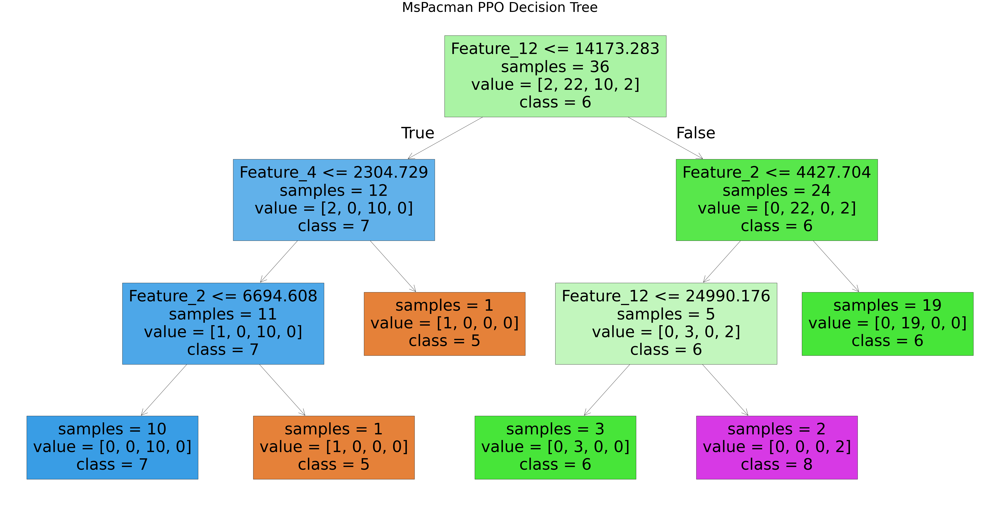

In [72]:
# Plot Decision Tree
plt.figure(figsize=(80, 40))
plot_tree(bd_DecisionTree, feature_names=feature_names, class_names=class_names, filled=True, impurity = False)
plt.title(r"MsPacman PPO Decision Tree", fontsize=60)
plt.savefig("./MsPacman/ppo/MsPacman_ppo_decision_tree.pdf", format="pdf", bbox_inches="tight")
plt.show()

# Decision Boundary Regression using Linear Regression

In [73]:
bd_LinearRegression = LinearRegression()

bd_LinearRegression.fit(bd_X, bd_Y)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
def round_and_clip(predictions, min_value=0, max_value=8):

    predictions_int = np.rint(predictions).astype(int)
    return np.clip(predictions_int, min_value, max_value)

In [ ]:
def display_linear_formula(lr, feature_names, F_name='f1', tol=1e-16):

    coefs = lr.coef_.ravel()
    intercept = float(lr.intercept_)
    
    terms = []
    for w, name in zip(coefs, feature_names):

        if abs(w) < tol:
            continue
        sign = "+" if w > 0 else "−"
        terms.append(f"{sign} {abs(w):.2e}·{name}")
    
    if not terms:
        formula = f"{F_name}(x) = {intercept:.2e}"
    else:
        formula = f"{F_name}(x) = {intercept:.2e} " + " ".join(terms)
    
    return formula

In [76]:
display_linear_formula(bd_LinearRegression, coefficient_names, F_name="f")

'f(x) = 7.37e+00 + 2.77e-04·x2 − 1.94e-04·x4 − 8.30e-03·x5 − 1.58e-03·x7 − 5.66e-04·x10 + 1.29e-03·x11 + 1.29e-05·x12 − 1.35e-04·x15'

# Decision Boundary Regression using Logistic Regression

In [77]:
bd_LogisticRegression = LogisticRegression(random_state=0, max_iter=10000, solver='saga', multi_class='multinomial')

bd_LogisticRegression.fit(bd_X, bd_Y)

c:\Users\Administrator\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,0
,solver,'saga'
,max_iter,10000
,multi_class,'multinomial'


In [ ]:
def display_logistic_regression_formulas(lr, feature_names, action_names, model_name='f'):

    coefs = lr.coef_  # shape = (n_classes, n_features)
    intercepts = lr.intercept_  # shape = (n_classes,)
    
    for k, action_name in enumerate(action_names):
        terms = []
        for i, name in enumerate(feature_names):
            if coefs[k, i] >= 0:
                terms.append(f"+ {coefs[k, i]:.2e}·{name}")
            else:
                terms.append(f"− {abs(coefs[k, i]):.2e}·{name}")

        formula = f"{model_name}_{action_name}(x) = {intercepts[k]:.2e} " + " ".join(terms)
        print(formula)

In [79]:
display_logistic_regression_formulas(bd_LogisticRegression, coefficient_names, class_names)

f_5(x) = 2.21e-07 + 0.00e+00·x1 + 9.61e-04·x2 + 0.00e+00·x3 + 1.69e-04·x4 − 9.86e-07·x5 + 0.00e+00·x6 + 1.27e-03·x7 + 0.00e+00·x8 + 0.00e+00·x9 + 8.61e-04·x10 + 3.03e-04·x11 − 4.15e-04·x12 + 0.00e+00·x13 + 0.00e+00·x14 − 7.49e-05·x15 + 0.00e+00·x16
f_6(x) = -1.14e-07 + 0.00e+00·x1 − 2.17e-03·x2 + 0.00e+00·x3 + 2.28e-03·x4 − 4.62e-07·x5 + 0.00e+00·x6 − 8.96e-04·x7 + 0.00e+00·x8 + 0.00e+00·x9 + 1.08e-03·x10 − 2.40e-04·x11 + 1.17e-03·x12 + 0.00e+00·x13 + 0.00e+00·x14 − 4.35e-04·x15 + 0.00e+00·x16
f_7(x) = 6.06e-07 + 0.00e+00·x1 + 1.90e-03·x2 + 0.00e+00·x3 − 1.47e-03·x4 + 1.58e-06·x5 + 0.00e+00·x6 − 3.68e-04·x7 + 0.00e+00·x8 + 0.00e+00·x9 + 1.11e-03·x10 − 5.90e-05·x11 − 2.23e-03·x12 + 0.00e+00·x13 + 0.00e+00·x14 + 1.75e-03·x15 + 0.00e+00·x16
f_8(x) = -7.12e-07 + 0.00e+00·x1 − 6.93e-04·x2 + 0.00e+00·x3 − 9.76e-04·x4 − 1.30e-07·x5 + 0.00e+00·x6 − 9.69e-06·x7 + 0.00e+00·x8 + 0.00e+00·x9 − 3.05e-03·x10 − 4.47e-06·x11 + 1.47e-03·x12 + 0.00e+00·x13 + 0.00e+00·x14 − 1.23e-03·x15 + 0.00e+00·x16


# Performance Evaluation

In [ ]:
def RL_run_episode(env, num_episodes, model):

    rewards = []

    for ep in range(num_episodes):
        obs = env.reset() 
        done = False
        total = 0

        while not done:
            action, _states = model.predict(obs, deterministic=True) 
            next_obs, reward, done, info = env.step(action)

            total += reward
            obs = next_obs       

        rewards.append(total)

    return rewards

def ML_run_episode(env, num_episodes, model):

    rewards = []

    for ep in range(num_episodes):
        obs = env.reset() 
        done = False
        total = 0

        while not done:
 
            features, action_logits = output_features_logits(obs)
            features = features.squeeze(0).cpu().detach().numpy()

            action = model.predict([features]) 

            if isinstance(model, LinearRegression):
                action = round_and_clip(action)

            next_obs, reward, done, info = env.step(action)

            total += reward
            obs = next_obs
        rewards.append(total)        

    return rewards

### PPO

In [135]:
PPO_result = RL_run_episode(MsPacman_env, 100, PPO_model)

print(PPO_result)
print(sum(PPO_result))

[array([1.], dtype=float32), array([21.], dtype=float32), array([46.], dtype=float32), array([15.], dtype=float32), array([10.], dtype=float32), array([11.], dtype=float32), array([11.], dtype=float32), array([14.], dtype=float32), array([11.], dtype=float32), array([11.], dtype=float32), array([14.], dtype=float32), array([11.], dtype=float32), array([11.], dtype=float32), array([14.], dtype=float32), array([11.], dtype=float32), array([52.], dtype=float32), array([4.], dtype=float32), array([11.], dtype=float32), array([52.], dtype=float32), array([4.], dtype=float32), array([35.], dtype=float32), array([16.], dtype=float32), array([10.], dtype=float32), array([11.], dtype=float32), array([52.], dtype=float32), array([4.], dtype=float32), array([11.], dtype=float32), array([11.], dtype=float32), array([14.], dtype=float32), array([11.], dtype=float32), array([52.], dtype=float32), array([4.], dtype=float32), array([35.], dtype=float32), array([16.], dtype=float32), array([10.], dtype

In [141]:
PPO_result_np = np.array(PPO_result)
np.save("./MsPacman/PPO_result.npy", PPO_result_np)

### Decision Tree

In [143]:
DT_result = ML_run_episode(MsPacman_env, 100, bd_DecisionTree)

print(DT_result)
print(sum(DT_result))

[array([7.], dtype=float32), array([34.], dtype=float32), array([29.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([37.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([35.], dtype=float32), array([7.], dtype=float32), array([35.], dtype=float32), array([4.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([37.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([37.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([37.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([37.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([29.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32), array([29.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([35.], dtype=float32), array([7.], dtype=float32), array([34.], dtype=float32),

In [144]:
DT_result_np = np.array(DT_result)
np.save("./MsPacman/PPO_DT_result.npy", DT_result_np)

loaded = np.load("PPO_result.npy", allow_pickle=True)

### Linear Regression

In [93]:
LinearRegression_result = ML_run_episode(MsPacman_env, 100, bd_LinearRegression)

print(LinearRegression_result)
print(sum(LinearRegression_result))

[array([21.], dtype=float32), array([5.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([17.], dtype=float32), array([7.], dtype=float32), array([3.], dtype=float32), array([17.], dtype=float32), array([7.], dtype=float32), array([3.], dtype=float32), array([17.], dtype=float32), array([7.], dtype=float32), array([3.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([8.], dty

In [180]:
LinearRegression_result_np = np.array(LinearRegression_result)
np.save("./MsPacman/PPO_LinearRegression_result.npy", LinearRegression_result_np)

### Logistic Regression

In [94]:
LogisticRegression_result = ML_run_episode(MsPacman_env, 100, bd_LogisticRegression)

print(LogisticRegression_result)
print(sum(LogisticRegression_result))

[array([1.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([8.], dtype=float32), array([0.], dtype=float32), array([0.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([1.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=float32), array([8.], dtype=float32), array([7.], dtype=float32), array([0.], dtype=f

In [181]:
LogisticRegression_result_np = np.array(LogisticRegression_result)
np.save("./MsPacman/PPO_LogisticRegression_result.npy", LogisticRegression_result_np)

# Fidelity Score Computation

In [111]:
num_episodes = 100

Decision_Tree_Fidelity = []
Linear_Regression_Fidelity = []
Logistic_Regression_Fidelity = []

for ep in range(num_episodes):
    obs = MsPacman_env.reset() 
    done = False

    Decision_Tree_Count = 0
    Linear_Regression_Count = 0
    Logistic_Regression_Count = 0

    epoch = 0 

    while not done:
        action, _states = PPO_model.predict(obs, deterministic=True) 

        features, action_logits = output_features_logits(obs)
        features = features.squeeze(0).cpu().detach().numpy()

        Decision_Tree_action = bd_DecisionTree.predict([features]) 
        Linear_Regression_action = round_and_clip(bd_LinearRegression.predict([features]))
        Logistic_Regression_action = bd_LogisticRegression.predict([features])

        if Decision_Tree_action == action:
            Decision_Tree_Count += 1

        if Linear_Regression_action == action:
            Linear_Regression_Count += 1

        if Logistic_Regression_action == action:
            Logistic_Regression_Count += 1
        
        next_obs, reward, done, info = MsPacman_env.step(action)

        obs = next_obs       
        epoch += 1

    Decision_Tree_Fidelity.append(Decision_Tree_Count/epoch)
    Linear_Regression_Fidelity.append(Linear_Regression_Count/epoch)
    Logistic_Regression_Fidelity.append(Logistic_Regression_Count/epoch)

In [112]:
Average_MsPacman_PPO_Decision_Tree_Fidelity = sum(Decision_Tree_Fidelity)/len(Decision_Tree_Fidelity)

In [113]:
Average_MsPacman_PPO_Linear_Regression_Fidelity = sum(Linear_Regression_Fidelity)/len(Linear_Regression_Fidelity)

In [114]:
Average_MsPacman_PPO_Logistic_Regression_Fidelity = sum(Logistic_Regression_Fidelity)/len(Logistic_Regression_Fidelity)

In [ ]:
results = {
    "Model": ["Decision Tree", "Linear Regression", "Logistic Regression"],
    "Average Fidelity": [
        Average_MsPacman_PPO_Decision_Tree_Fidelity,
        Average_MsPacman_PPO_Linear_Regression_Fidelity,
        Average_MsPacman_PPO_Logistic_Regression_Fidelity
    ]
}

df = pd.DataFrame(results)

df.to_csv("MsPacman_PPO_Fidelity.csv", index=False)

print("✅ Fidelity results saved to MsPacman_PPO_Fidelity.csv")

✅ Fidelity results saved to MsPacman_PPO_Fidelity.csv


# Human Study

In [151]:
from gymnasium.wrappers import RecordVideo

### Decision Tree Gameclips

In [ ]:
def make_MsPacman_env_video():
  env = gym.make("MsPacmanNoFrameskip-v4", render_mode="rgb_array")
  env = AtariWrapper(env)
  env = RecordVideo(env, video_folder="./MsPacman/videos", name_prefix="decision_tree_MsPacman")  
  return env

In [ ]:
n_envs = 1
MsPacman_video_env = DummyVecEnv([make_MsPacman_env_video for _ in range(n_envs)]) 
MsPacman_video_env = VecTransposeImage(MsPacman_video_env) 
MsPacman_video_env = VecFrameStack(MsPacman_video_env, n_stack=4) 

c:\Users\Administrator\AppData\Local\Programs\Python\Python310\lib\site-packages\gymnasium\wrappers\rendering.py:283: UserWarning: WARN: Overwriting existing videos at d:\XRL Research\MsPacman\videos folder (try specifying a different `video_folder` for the `RecordVideo` wrapper if this is not desired)
  logger.warn(


In [168]:
num_episodes = 1

for ep in range(num_episodes):
    obs = MsPacman_video_env.reset() 
    done = False

    while not done:

        features, action_logits = output_features_logits(obs)
        features = features.squeeze(0).cpu().detach().numpy()

        Decision_Tree_action = bd_DecisionTree.predict([features]) 
        
        next_obs, reward, done, info = MsPacman_video_env.step(Decision_Tree_action)

MsPacman_video_env.close()